# Summary of Project

The following notebook runs through the general methodology as well as the key findings across the project, this also contains visual aids in form of graphs, screenshots of notebook activities, tables and cell blocks. Our aim was to develop a model that can predict future rental prices to effectively deliver insights on rental properties in the suburbs of Victoria for consulting an online real estate company.

The Sections of this notebook split into the 6 parts of our project pipeline:
1. Data Gathering
2. Preprocessing
3. Preliminary Analysis
4. Modelling
5. Forecasts & Key Findings
6. Final Notes & Conclusion
Each section includes a summary of the overall approach, limitations encountered and assumptions made.

In [6]:
from IPython.display import Image

## 1. Data Gathering

All datasets used are listed out in the readme file, this includes a list of 19 Datasets of 17 were used in our final analysis and modelling.
Some of these datasets were deemed useful and gathered in the initial planning phase such as crime and ABS data, whilst other data such as coastline data was found to be useful after preliminary analysis was conducted, 2 datasets down the pipeline proved to be not useful this was the Domain dataset and internet speed data (not included in the readme, the data could not be preprocessed effectively, this is discussed further in preprocessing). 
Perhaps the largest hiccup in this stage was the discovery of a lack of historical rental data on domain.com.au and a lack of permission to scrape on realestate.com, hence, we resorted to using rental data from the DFFH. We would have preferred to scrape individual housing data and aggregated these values into suburb rental values ourselves to ensure high accuracy, but DFFH data served as a reasonable work around. 


## 2. Preprocessing

DFFH data did not use individual suburbs in every case, rather they used a self-defined form of suburb clusters that grouped certain ones together. We tried to obtain the shape file to ascertain the exact list of suburbs in the cluster through emailing the agency directly, but unfortunately they did not respond. So, we mapped the suburbs manually using a map of suburbs from the ABS - denoted as SAL - and the following map of suburb clusters:

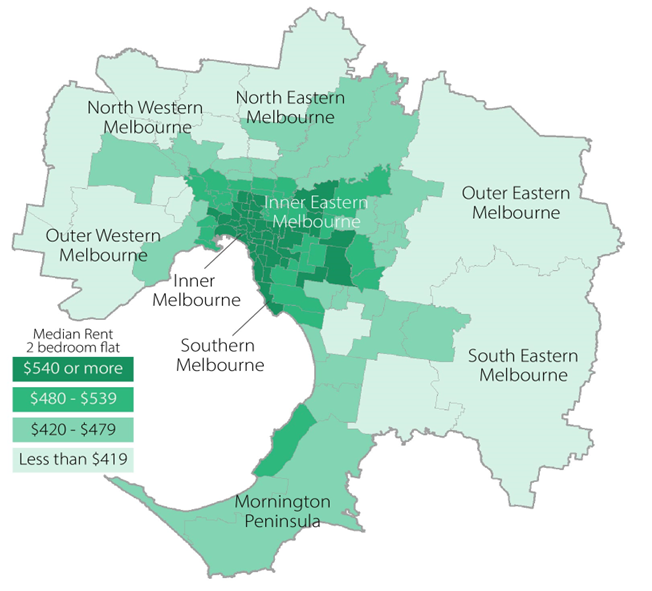

In [7]:
Image('../plots/Summary_Suburb_Clusters_DFFH.png')

To merge all the features together, we left-joined the values based on the suburbs. 

We transformed the response variable to be the median rental price divided by inflation and people per household, as we found that inflation had a significant impact on rent through time and since it was a variable that affected the currency itself rather than the value of rent, we decided to input it into the response variable. 


## 3. Preliminary Analysis

Discarded suburbs with population lower than 800 and Ravenhall. The 800 value was found through the elbow method, and Ravenhall was removed because a vast majority of its population belonged to a prison

## 4. Modelling

## 5. Forecasts & Key Findings

#### 5.1 Growth

#### 5.2 Liveability

We adapted the Global Liveability Index from the Economist Intelligence Unit (EIU) and applied weights arbitrarily based on our discretion to relevant features that relate to stability, healthcare, culture and environment, education, and infrastructure and summed said features up to form an index of our own. A higher score would mean higher liveability and vice versa. Some of the biggest contributors to the score were crime, education, and beach proximity.

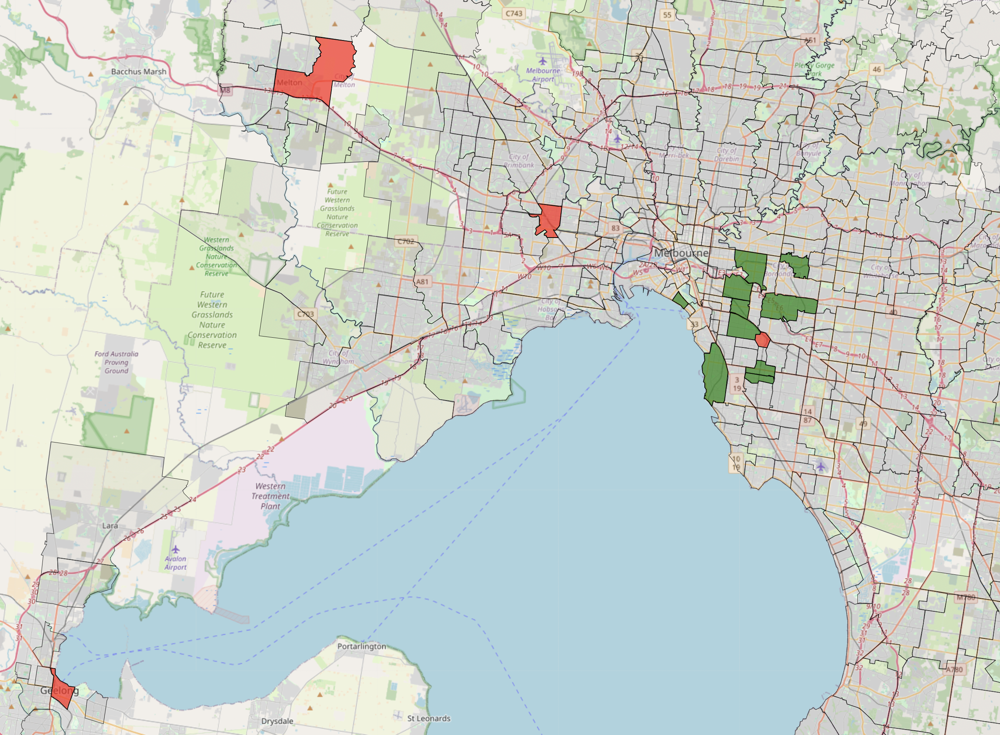

In [8]:
Image('../plots/Summary_liveability.png')

We find that the top 10 most liveable suburbs such as Canterbury, Brighton, and Middle Park are centered around eastern melbourne while the least liveable suburbs such as Bendigo and Geelong are scattered outside of the city and regional victoria with the full list below. Interestingly enough a lot of the suburbs that are deemed least liveable are due to a high number of drug related crimes.

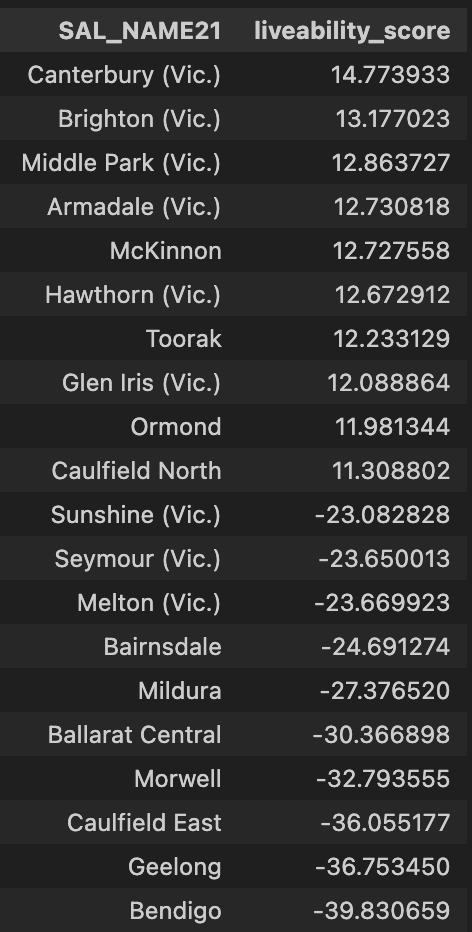

In [9]:
Image('../plots/Summary_liveability_table.png')

#### 5.3 Affordability

Affordability was calculated by taking the ratio of median family weekly income and adjusted average weekly rent. Based on that, we can see clearly that suburbs in the CBD obviously have the least affordability as they command a high weekly rent while the suburbs in newer affordable developments as well as those with lower weekly rent have higher affordability. 

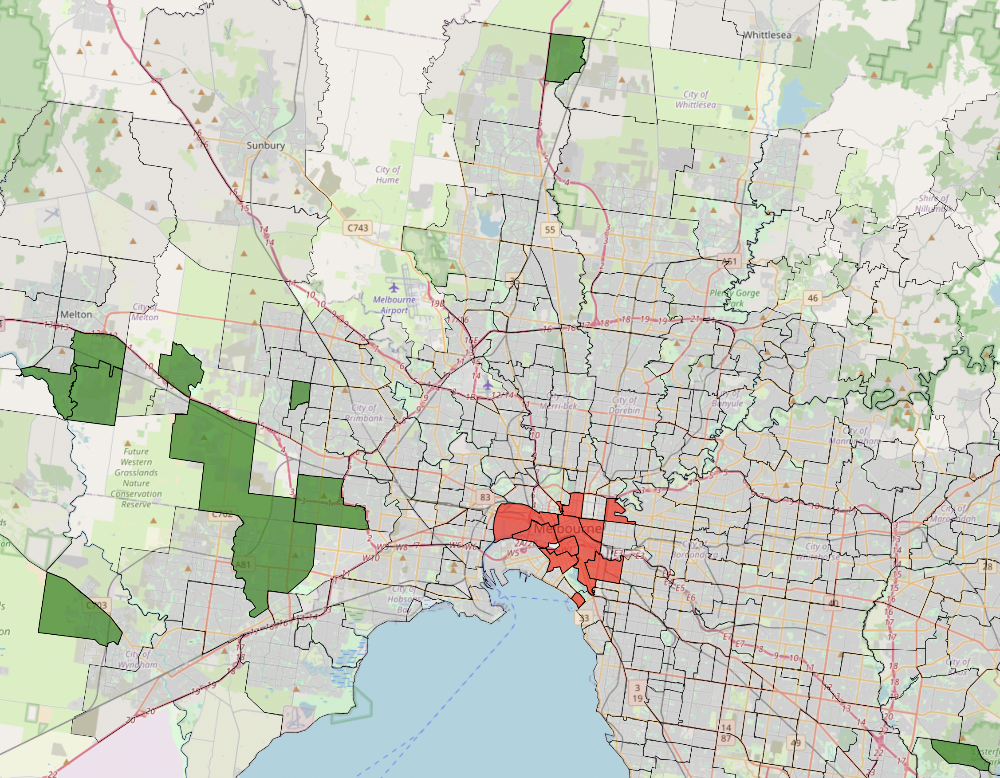

In [10]:
Image('../plots/Summary_affordability_map.png')

In [17]:
import pandas as pd
# Hardcoding the first table (Affordability Index)
affordability_data = {
    'SAL_NAME21': [
        'Cobblebank', 'Aintree', 'Weir Views', 'Strathtulloh', 'Kalkallo',
        'Truganina', 'Derrimut', 'Burnside Heights', 'Manor Lakes', 'Lysterfield South',
        'Abbotsford (Vic.)', 'East Melbourne', 'South Melbourne', 'West Melbourne', 
        'Carlton (Vic.)', 'St Kilda West', 'South Yarra', 'Southbank', 'Docklands', 'Melbourne'
    ],
    'affordability_index': [
        0.089716, 0.088354, 0.084913, 0.084124, 0.077302, 
        0.077170, 0.075595, 0.074719, 0.074032, 0.074009, 
        0.028743, 0.028685, 0.028651, 0.028018, 0.028002, 
        0.027873, 0.027245, 0.025384, 0.023707, 0.021520
    ]
}

# Convert to DataFrame
affordability_df = pd.DataFrame(affordability_data)
affordability_df

,SAL_NAME21,affordability_index
0,Cobblebank,0.089716
1,Aintree,0.088354
2,Weir Views,0.084913
3,Strathtulloh,0.084124
4,Kalkallo,0.077302
5,Truganina,0.077170
6,Derrimut,0.075595
7,Burnside Heights,0.074719
8,Manor Lakes,0.074032
9,Lysterfield South,0.074009


#### 5.4 Assumptions
- The Global Liveability Index was an appropiate scoring metric to model our own weights off

#### 5.5 Limitations
- Data that contributed to the weightings of the liveability scoring categories: stability, healthcare, culture and environment, education, and infrastructure was limited to the data we scraped. This means we had more data on some categories then others, this still is believed not have a dramatic effect on results.

## 6. Final Conclusions

Based on our findings, we believe these insights can be transformed into valuable consulting services for various stakeholders, particularly online real estate firms. These firms are constantly seeking data-driven insights to inform smarter, strategic decisions, and we are confident they would be willing to pay a premium for services like ours. With our model, they can accurately determine rental prices and identify growth opportunities in their property portfolios. We could offer customized reports on rental price forecasts, growth potential, and livability insights, helping firms stay ahead of the market and capitalize on high-growth opportunities.

Given the progress we've made in just six weeks and the strength of our highly accurate model, this project is well worth pursuing. We could begin offering custom reports within 1-3 months and scale to a subscription-based service in 3-6 months by automating our processes. By partnering with real estate firms, we could also gain access to better data, further refining our model and enhancing the accuracy of our insights, creating a mutually beneficial opportunity for both us and our clients.
